Connected to arena (Python 3.13.13)

In [ ]:
import torch
from torch import Tensor, nn
import numpy as np
import plotly.graph_objects as go
import einops
import itertools
import sys 
from pathlib import Path


# Make sure exercises are in the path
chapter = "chapter0_fundamentals"
section = "part2_cnns"
#root_dir = next(p for p in Path.cwd().parents if (p / chapter).exists())
root_dir = Path("/Users/sebastin/Documents/perso/ARENA_training/ARENA_3.0")
exercises_dir = root_dir / chapter / "exercises"
section_dir = exercises_dir / section
if str(exercises_dir) not in sys.path:
    sys.path.append(str(exercises_dir))

MAIN = __name__ == "__main__"

import part2_cnns.tests as tests
import part2_cnns.utils as utils
from plotly_utils import line

In [ ]:
class ReLU(nn.Module):
    def forward(self, x: Tensor) -> Tensor:
        return torch.max(x, torch.zeros_like(x))


tests.test_relu(ReLU)

All tests in `test_relu` passed!


In [ ]:
class Linear(nn.Module):
    def __init__(self, in_features: int, out_features: int, bias=True):
        """
        A simple linear (technically, affine) transformation.

        The fields should be named `weight` and `bias` for compatibility with PyTorch.
        If `bias` is False, set `self.bias` to None.
        """
        super().__init__()
        self.weight = nn.Parameter(torch.randn(out_features, in_features))
        if bias:
            self.bias = nn.Parameter(torch.randn(out_features))
        else:
            self.bias = None

        # weight initialization
        nn.init.kaiming_uniform_(self.weight, a=0)


    def forward(self, x: Tensor) -> Tensor:
        """
        x: shape (*, in_features)
        Return: shape (*, out_features)
        """
        y = x @ self.weight.T + (self.bias if self.bias is not None else 0)
        return y

    def extra_repr(self) -> str:
        return f"in_features={self.weight.shape[1]}, out_features={self.weight.shape[0]}, bias={self.bias is not None}"
    


tests.test_linear_parameters(Linear, bias=False)
tests.test_linear_parameters(Linear, bias=True)
tests.test_linear_forward(Linear, bias=False)
tests.test_linear_forward(Linear, bias=True)

All tests in `test_linear_parameters` passed!
All tests in `test_linear_parameters` passed!
All tests in `test_linear_forward` passed!
All tests in `test_linear_forward` passed!


In [ ]:
class Flatten(nn.Module):
    def __init__(self, start_dim: int = 1, end_dim: int = -1) -> None:
        super().__init__()
        self.start_dim = start_dim
        self.end_dim = end_dim

    def forward(self, input: Tensor) -> Tensor:
        """
        Flatten out dimensions from start_dim to end_dim, inclusive of both.
        """
        shape = input.shape

        # Get start & end dims, handling negative indexing for end dim
        start_dim = self.start_dim
        end_dim = self.end_dim if self.end_dim >= 0 else len(shape) + self.end_dim

        # Get the shapes to the left / right of flattened dims, as well as size of flattened middle
        shape_left = shape[:start_dim]
        shape_right = shape[end_dim + 1 :]
        shape_middle = t.prod(t.tensor(shape[start_dim : end_dim + 1])).item()

        return t.reshape(input, shape_left + (shape_middle,) + shape_right)

    def extra_repr(self) -> str:
        return ", ".join([f"{key}={getattr(self, key)}" for key in ["start_dim", "end_dim"]])

In [ ]:
class SimpleMLP(nn.Module):
    def __init__(self, d_in: int = 28**2, d_hidden: int = 100, d_out: int = 10):
        super().__init__()
        self.flatten = Flatten()
        self.layers = nn.Sequential(
            Linear(d_in, d_hidden),
            ReLU(),
            Linear(d_hidden, d_out)
        )

    def forward(self, x: Tensor) -> Tensor:
        input = self.flatten(x)
        output = self.layers(input)
        return output


tests.test_mlp_module(SimpleMLP)
tests.test_mlp_forward(SimpleMLP)

ModuleNotFoundError: No module named 'rich'

In [ ]:
class SimpleMLP(nn.Module):
    def __init__(self, d_in: int = 28**2, d_hidden: int = 100, d_out: int = 10):
        super().__init__()
        self.flatten = Flatten()
        self.layers = nn.Sequential(
            Linear(d_in, d_hidden),
            ReLU(),
            Linear(d_hidden, d_out)
        )

    def forward(self, x: Tensor) -> Tensor:
        input = self.flatten(x)
        output = self.layers(input)
        return output


tests.test_mlp_module(SimpleMLP)
tests.test_mlp_forward(SimpleMLP)

ModuleNotFoundError: No module named 'torchvision'

In [ ]:
class SimpleMLP(nn.Module):
    def __init__(self, d_in: int = 28**2, d_hidden: int = 100, d_out: int = 10):
        super().__init__()
        self.flatten = Flatten()
        self.layers = nn.Sequential(
            Linear(d_in, d_hidden),
            ReLU(),
            Linear(d_hidden, d_out)
        )

    def forward(self, x: Tensor) -> Tensor:
        input = self.flatten(x)
        output = self.layers(input)
        return output


tests.test_mlp_module(SimpleMLP)
tests.test_mlp_forward(SimpleMLP)

AssertionError: Your SimpleMLP should declare the following parameters in order.
Expected: ['linear1.weight', 'linear1.bias', 'linear2.weight', 'linear2.bias']
Actual: ['layers.0.weight', 'layers.0.bias', 'layers.2.weight', 'layers.2.bias']

In [ ]:
class SimpleMLP(nn.Module):
    def __init__(self, d_in: int = 28**2, d_hidden: int = 100, d_out: int = 10):
        super().__init__()
        self.flatten = Flatten()
        #self.layers = nn.Sequential(
        #    Linear(d_in, d_hidden),
        #    ReLU(),
        #    Linear(d_hidden, d_out)
        #)
        self.linear1 = Linear(d_in, d_hidden)
        self.relu = ReLU()
        self.linear2 = Linear(d_hidden, d_out)

    def forward(self, x: Tensor) -> Tensor:
        input = self.flatten(x)
        l1 = self.linear1(input)
        r1 = self.relu(l1)
        output = self.linear2(r1)
        return output


tests.test_mlp_module(SimpleMLP)
tests.test_mlp_forward(SimpleMLP)

All tests in `test_mlp_module` passed!
All tests in `test_mlp_forward` passed!


In [ ]:
word = "hello!"
pbar = tqdm(enumerate(word), total=len(word))
t0 = time.time()

for i, letter in pbar:
    time.sleep(1.0)
    pbar.set_postfix(i=i, letter=letter, time=f"{time.time()-t0:.3f}")

100%|██████████| 6/6 [00:06<00:00,  1.01s/it, i=5, letter=!, time=6.034]


In [ ]:
device = t.device("mps" if t.backends.mps.is_available() else "cuda" if t.cuda.is_available() else "cpu")
print(device)

mps


In [ ]:
MNIST_TRANSFORM = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Normalize(0.1307, 0.3081),
    ]
)

def get_mnist(trainset_size: int = 10_000, testset_size: int = 1_000) -> tuple[Subset, Subset]:
    """Returns a subset of MNIST training data."""

    # Get original datasets, which are downloaded to "./data" for future use
    mnist_trainset = datasets.MNIST(exercises_dir / "data", train=True, download=True, transform=MNIST_TRANSFORM)
    mnist_testset = datasets.MNIST(exercises_dir / "data", train=False, download=True, transform=MNIST_TRANSFORM)

    # # Return a subset of the original datasets
    mnist_trainset = Subset(mnist_trainset, indices=range(trainset_size))
    mnist_testset = Subset(mnist_testset, indices=range(testset_size))

    return mnist_trainset, mnist_testset


mnist_trainset, mnist_testset = get_mnist()
mnist_trainloader = DataLoader(mnist_trainset, batch_size=64, shuffle=True)
mnist_testloader = DataLoader(mnist_testset, batch_size=64, shuffle=False)

# Get the first batch of test data, by starting to iterate over `mnist_testloader`
for img_batch, label_batch in mnist_testloader:
    print(f"{img_batch.shape=}\n{label_batch.shape=}\n")
    break

# Get the first datapoint in the test set, by starting to iterate over `mnist_testset`
for img, label in mnist_testset:
    print(f"{img.shape=}\n{label=}\n")
    break

t.testing.assert_close(img, img_batch[0])
assert label == label_batch[0].item()

100%|██████████| 9.91M/9.91M [00:00<00:00, 13.8MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 3.63MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 13.3MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 6.09MB/s]


img_batch.shape=torch.Size([64, 1, 28, 28])
label_batch.shape=torch.Size([64])

img.shape=torch.Size([1, 28, 28])
label=7



In [ ]:
model = SimpleMLP().to(device)

batch_size = 64
epochs = 3

mnist_trainset, _ = get_mnist()
mnist_trainloader = DataLoader(mnist_trainset, batch_size=batch_size, shuffle=True)

optimizer = t.optim.Adam(model.parameters(), lr=1e-3)
loss_list = []

for epoch in range(epochs):
    pbar = tqdm(mnist_trainloader)

    for imgs, labels in pbar:
        # Move data to device, perform forward pass
        imgs, labels = imgs.to(device), labels.to(device)
        logits = model(imgs)

        # Calculate loss, perform backward pass
        loss = F.cross_entropy(logits, labels)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        # Update logs & progress bar
        loss_list.append(loss.item())
        pbar.set_postfix(epoch=f"{epoch + 1}/{epochs}", loss=f"{loss:.3f}")

line(
    loss_list,
    x_max=epochs * len(mnist_trainset),
    labels={"x": "Examples seen", "y": "Cross entropy loss"},
    title="SimpleMLP training on MNIST",
    width=500,
)

100%|██████████| 157/157 [00:01<00:00, 147.21it/s, epoch=3/3, loss=0.221]


In [ ]:
@dataclass
class SimpleMLPTrainingArgs:
    """
    Defining this class implicitly creates an __init__ method, which sets arguments as below, e.g.
    self.batch_size=64. Any of these fields can also be overridden when you create an instance, e.g.
    SimpleMLPTrainingArgs(batch_size=128).
    """

    batch_size: int = 64
    epochs: int = 3
    learning_rate: float = 1e-3


def train(args: SimpleMLPTrainingArgs) -> tuple[list[float], SimpleMLP]:
    """
    Trains & returns the model, using training parameters from the `args` object. Returns the model,
    and loss list.
    """
    model = SimpleMLP().to(device)

    mnist_trainset, _ = get_mnist()
    mnist_trainloader = DataLoader(mnist_trainset, batch_size=args.batch_size, shuffle=True)

    optimizer = t.optim.Adam(model.parameters(), lr=args.learning_rate)
    loss_list = []

    for epoch in range(args.epochs):
        pbar = tqdm(mnist_trainloader)

        for imgs, labels in pbar:
            # Move data to device, perform forward pass
            imgs, labels = imgs.to(device), labels.to(device)
            logits = model(imgs)

            # Calculate loss, perform backward pass
            loss = F.cross_entropy(logits, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            # Update logs & progress bar
            loss_list.append(loss.item())
            pbar.set_postfix(epoch=f"{epoch + 1}/{args.epochs}", loss=f"{loss:.3f}")

    return loss_list, model


args = SimpleMLPTrainingArgs()
loss_list, model = train(args)

line(
    loss_list,
    x_max=args.epochs * len(mnist_trainset),
    labels={"x": "Examples seen", "y": "Cross entropy loss"},
    title="SimpleMLP training on MNIST",
    width=600,
)

100%|██████████| 157/157 [00:01<00:00, 141.11it/s, epoch=3/3, loss=0.443]


In [ ]:
def train(args: SimpleMLPTrainingArgs) -> tuple[list[float], list[float], SimpleMLP]:
    """
    Trains the model, using training parameters from the `args` object.

    Returns:
        The model, and lists of loss & accuracy.
    """
    
    model = SimpleMLP().to(device)

    mnist_trainset, mnist_testset = get_mnist()
    mnist_trainloader = DataLoader(mnist_trainset, batch_size=args.batch_size, shuffle=True)
    mnist_testloader = DataLoader(mnist_testset, batch_size=args.batch_size, shuffle=False)

    optimizer = t.optim.Adam(model.parameters(), lr=args.learning_rate)
    loss_list = []
    accuracy_list = []

    for epoch in range(args.epochs):
        
        # Training loop
        pbar = tqdm(mnist_trainloader)
        model.train()
        for imgs, labels in pbar:
            # Move data to device, perform forward pass
            imgs, labels = imgs.to(device), labels.to(device)
            logits = model(imgs)

            # Calculate loss, perform backward pass
            loss = F.cross_entropy(logits, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

            # Update logs & progress bar
            loss_list.append(loss.item())
            pbar.set_postfix(epoch=f"{epoch + 1}/{args.epochs}", loss=f"{loss:.3f}")

        # Validation loop
        model.eval()
        correct, total = 0, 0
        with t.inference_mode():
            for imgs, labels in mnist_testloader:
                imgs, labels = imgs.to(device), labels.to(device)
                logits = model(imgs)
                predictions = t.argmax(logits, dim=-1)
                correct += (predictions == labels).sum().item()
                total += labels.shape[0]
            accuracy_list.append(correct / total)

    return loss_list, accuracy_list, model


args = SimpleMLPTrainingArgs()
loss_list, accuracy_list, model = train(args)

line(
    y=[loss_list, [0.1] + accuracy_list],  # we start by assuming a uniform accuracy of 10%
    use_secondary_yaxis=True,
    x_max=args.epochs * len(mnist_trainset),
    labels={"x": "Num examples seen", "y1": "Cross entropy loss", "y2": "Test Accuracy"},
    title="SimpleMLP training on MNIST",
    width=600,
)

100%|██████████| 157/157 [00:01<00:00, 137.42it/s, epoch=3/3, loss=0.131]


In [ ]:
class Conv2d(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        kernel_size: int,
        stride: int = 1,
        padding: int = 0,
    ):
        """
        Same as torch.nn.Conv2d with bias=False.

        Name your weight field `self.weight` for compatibility with the PyTorch version.

        We assume kernel is square, with height = width = `kernel_size`.
        """
        super().__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        sf = 1 / np.sqrt(in_channels * kernel_size * kernel_size)
        self.weight = nn.Parameter(sf * (2 * t.rand(out_channels, in_channels, kernel_size, kernel_size) - 1))



    def forward(self, x: Tensor) -> Tensor:
        """Apply the functional conv2d, which you can import."""
        return t.nn.functional.conv2d(x, self.weight, stride=self.stride, padding=self.padding)

    def extra_repr(self) -> str:
        keys = ["in_channels", "out_channels", "kernel_size", "stride", "padding"]
        return ", ".join([f"{key}={getattr(self, key)}" for key in keys])


tests.test_conv2d_module(Conv2d)
m = Conv2d(in_channels=24, out_channels=12, kernel_size=3, stride=2, padding=1)
print(f"Manually verify that this is an informative repr: {m}")

All tests in `test_conv2d_module` passed!
Manually verify that this is an informative repr: Conv2d(in_channels=24, out_channels=12, kernel_size=3, stride=2, padding=1)


In [ ]:
class MaxPool2d(nn.Module):
    def __init__(self, kernel_size: int, stride: int | None = None, padding: int = 1):
        super().__init__()
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding

    def forward(self, x: Tensor) -> Tensor:
        """Call the functional version of maxpool2d."""
        return F.max_pool2d(x, kernel_size=self.kernel_size, stride=self.stride, padding=self.padding)

    def extra_repr(self) -> str:
        """Add additional information to the string representation of this class."""
        return ", ".join([f"{key}={getattr(self, key)}" for key in ["kernel_size", "stride", "padding"]])

In [ ]:
class Sequential(nn.Module):
    _modules: dict[str, nn.Module]

    def __init__(self, *modules: nn.Module):
        super().__init__()
        for index, mod in enumerate(modules):
            self._modules[str(index)] = mod

    def __getitem__(self, index: int) -> nn.Module:
        index %= len(self._modules)  # deal with negative indices
        return self._modules[str(index)]

    def __setitem__(self, index: int, module: nn.Module) -> None:
        index %= len(self._modules)  # deal with negative indices
        self._modules[str(index)] = module

    def forward(self, x: Tensor) -> Tensor:
        """Chain each module together, with the output from one feeding into the next one."""
        for mod in self._modules.values():
            x = mod(x)
        return x

In [ ]:
class BatchNorm2d(nn.Module):
    # The type hints below aren't functional, they're just for documentation
    running_mean: Float[Tensor, " num_features"]
    running_var: Float[Tensor, " num_features"]
    num_batches_tracked: Int[Tensor, ""]  # This is how we denote a scalar tensor

    def __init__(self, num_features: int, eps=1e-05, momentum=0.1):
        """
        Like nn.BatchNorm2d with track_running_stats=True and affine=True.

        Name the learnable affine parameters `weight` and `bias` in that order.
        """
        super().__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum

        self.weight = nn.Parameter(t.ones(num_features))
        self.bias = nn.Parameter(t.zeros(num_features))

        self.register_buffer("running_mean", t.zeros(num_features))
        self.register_buffer("running_var", t.ones(num_features))
        self.register_buffer("num_batches_tracked", t.tensor(0))

    def forward(self, x: Tensor) -> Tensor:
        """
        Normalize each channel.

        Compute the variance using `torch.var(x, unbiased=False)`
        Hint: you may also find it helpful to use the argument `keepdim`.

        x: shape (batch, channels, height, width)
        Return: shape (batch, channels, height, width)
        """
        if self.training:
            batch_mean = t.mean(x, dim=(0, 2, 3))  # shape (channels,)
            batch_var = t.var(x, dim=(0, 2, 3), unbiased=False)  # shape (channels,)

            # Update running stats
            with t.no_grad():
                self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * batch_mean
                self.running_var = (1 - self.momentum) * self.running_var + self.momentum * batch_var
                self.num_batches_tracked += 1

            mean = batch_mean
            var = batch_var
        else:
            mean = self.running_mean
            var = self.running_var

        x_normalized = (x - mean[None, :, None, None]) / t.sqrt(var[None, :, None, None] + self.eps)
        out = self.weight[None, :, None, None] * x_normalized + self.bias[None, :, None, None]
        return out

    def extra_repr(self) -> str:
        keys = ["num_features", "eps", "momentum"]
        return ", ".join([f"{key}={getattr(self, key)}" for key in keys])


tests.test_batchnorm2d_module(BatchNorm2d)
tests.test_batchnorm2d_forward(BatchNorm2d)
tests.test_batchnorm2d_running_mean(BatchNorm2d)

All tests in `test_batchnorm2d_module` passed!
All tests in `test_batchnorm2d_forward` passed!
All tests in `test_batchnorm2d_running_mean` passed!


In [ ]:
class AveragePool(nn.Module):
    def forward(self, x: Tensor) -> Tensor:
        """
        x: shape (batch, channels, height, width)
        Return: shape (batch, channels)
        """
        return x.mean(dim=(2, 3))


tests.test_averagepool(AveragePool)

All tests in `test_averagepool` passed!


In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_feats: int, out_feats: int, first_stride=1):
        """
        A single residual block with optional downsampling.

        For compatibility with the pretrained model, declare the left side branch first using a
        `Sequential`.

        If first_stride is > 1, this means the optional (conv + bn) should be present on the right
        branch. Declare it second using another `Sequential`.
        """
        super().__init__()
        is_shape_preserving = (first_stride == 1) and (in_feats == out_feats)  # determines if right branch is identity
        self.left_branch = Sequential(
            Conv2d(in_feats, out_feats, kernel_size=3, stride=first_stride, padding=1),
            BatchNorm2d(out_feats),
            ReLU(),
            Conv2d(out_feats, out_feats, kernel_size=3, stride=1, padding=1),
            BatchNorm2d(out_feats)
        )
        if is_shape_preserving:
            self.right_branch = Sequential()  # identity
        else:
            self.right_branch = Sequential(
                Conv2d(in_feats, out_feats, kernel_size=1, stride=first_stride, padding=0),
                BatchNorm2d(out_feats)
            )

    def forward(self, x: Tensor) -> Tensor:
        """
        Compute the forward pass. If no downsampling block is present, the addition should just add
        the left branch's output to the input.

        x: shape (batch, in_feats, height, width)

        Return: shape (batch, out_feats, height / stride, width / stride)
        """
        left_out = self.left_branch(x)
        right_out = self.right_branch(x)
        out = F.relu(left_out + right_out)
        return out


tests.test_residual_block(ResidualBlock)

Passed all tests when first_stride=1
Passed all tests when first_stride>1
All tests in `test_residual_block` passed!


In [ ]:
class BlockGroup(nn.Module):
    def __init__(self, n_blocks: int, in_feats: int, out_feats: int, first_stride=1):
        """
        An n_blocks-long sequence of ResidualBlock where only the first block uses the provided
        stride.
        """
        super().__init__()
        self.block = nn.Sequential(
            ResidualBlock(in_feats, out_feats, first_stride=first_stride),
            *[ResidualBlock(out_feats, out_feats, first_stride=1) for _ in range(n_blocks - 1)]
        )
        

    def forward(self, x: Tensor) -> Tensor:
        """
        Compute the forward pass.

        x: shape (batch, in_feats, height, width)

        Return: shape (batch, out_feats, height / first_stride, width / first_stride)
        """
        return self.block(x)


tests.test_block_group(BlockGroup)

Passed all tests when first_stride=1
Passed all tests when first_stride>1
Passed all tests when n_blocks>2
All tests in `test_block_group` passed!


In [ ]:
class ResNet34(nn.Module):
    def __init__(
        self,
        n_blocks_per_group=[3, 4, 6, 3],
        out_features_per_group=[64, 128, 256, 512],
        first_strides_per_group=[1, 2, 2, 2],
        n_classes=1000,
    ):
        super().__init__()
        out_feats0 = 64
        self.n_blocks_per_group = n_blocks_per_group
        self.out_features_per_group = out_features_per_group
        self.first_strides_per_group = first_strides_per_group
        self.n_classes = n_classes

        # YOUR CODE HERE - define all components of resnet34
        self.stem = Sequential(
            Conv2d(3, out_feats0, kernel_size=7, stride=2, padding=3),
            BatchNorm2d(out_feats0),
            ReLU(),
            nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        )
        self.block_groups = nn.Sequential(*[
            BlockGroup(n_blocks_per_group[i], out_feats0 if i == 0 else out_features_per_group[i-1], out_features_per_group[i], first_strides_per_group[i])
            for i in range(4)
        ])   
        self.avgpool = AveragePool()
        self.mlp = Linear(out_features_per_group[-1], n_classes)

    def forward(self, x: Tensor) -> Tensor:
        """
        x: shape (batch, channels, height, width)
        Return: shape (batch, n_classes)
        """
        x = self.stem(x)
        x = self.block_groups(x)
        x = self.avgpool(x)
        out = self.mlp(x)
        return out


my_resnet = ResNet34()

# (1) Test via helper function `print_param_count`
target_resnet = models.resnet34()  # without supplying a `weights` argument, we just initialize with random weights
utils.print_param_count(my_resnet, target_resnet)

# (2) Test via `torchinfo.summary`
print("My model:", torchinfo.summary(my_resnet, input_size=(1, 3, 64, 64)), sep="\n")
print(
    "\nReference model:",
    torchinfo.summary(target_resnet, input_size=(1, 3, 64, 64), depth=2),
    sep="\n",
)

Model 1, total params = 21797672
Model 2, total params = 21797672
All parameter shapes match, and are in the same order!


,name_1,shape_1,num_params_1,num_params_2,shape_2,name_2
0,stem.0.weight,"(64, 3, 7, 7)",9408,9408,"(64, 3, 7, 7)",conv1.weight
1,stem.1.weight,"(64,)",64,64,"(64,)",bn1.weight
2,stem.1.bias,"(64,)",64,64,"(64,)",bn1.bias
3,block_groups.0.block.0.left_branch.0.weight,"(64, 64, 3, 3)",36864,36864,"(64, 64, 3, 3)",layer1.0.conv1.weight
4,block_groups.0.block.0.left_branch.1.weight,"(64,)",64,64,"(64,)",layer1.0.bn1.weight
5,block_groups.0.block.0.left_branch.1.bias,"(64,)",64,64,"(64,)",layer1.0.bn1.bias
6,block_groups.0.block.0.left_branch.3.weight,"(64, 64, 3, 3)",36864,36864,"(64, 64, 3, 3)",layer1.0.conv2.weight
7,block_groups.0.block.0.left_branch.4.weight,"(64,)",64,64,"(64,)",layer1.0.bn2.weight
8,block_groups.0.block.0.left_branch.4.bias,"(64,)",64,64,"(64,)",layer1.0.bn2.bias
9,block_groups.0.block.1.left_branch.0.weight,"(64, 64, 3, 3)",36864,36864,"(64, 64, 3, 3)",layer1.1.conv1.weight


My model:
Layer (type:depth-idx)                             Output Shape              Param #
ResNet34                                           [1, 1000]                 --
├─Sequential: 1-1                                  [1, 64, 16, 16]           --
│    └─Conv2d: 2-1                                 [1, 64, 32, 32]           9,408
│    └─BatchNorm2d: 2-2                            [1, 64, 32, 32]           128
│    └─ReLU: 2-3                                   [1, 64, 32, 32]           --
│    └─MaxPool2d: 2-4                              [1, 64, 16, 16]           --
├─Sequential: 1-2                                  [1, 512, 2, 2]            --
│    └─BlockGroup: 2-5                             [1, 64, 16, 16]           --
│    │    └─Sequential: 3-1                        [1, 64, 16, 16]           221,952
│    └─BlockGroup: 2-6                             [1, 128, 8, 8]            --
│    │    └─Sequential: 3-2                        [1, 128, 8, 8]            1,116,416
│    └─Bl

In [ ]:
def copy_weights(my_resnet: ResNet34, pretrained_resnet: models.resnet.ResNet) -> ResNet34:
    """Copy over the weights of `pretrained_resnet` to your resnet."""

    # Get the state dictionaries for each model, check they have the same number of parameters &
    # buffers
    mydict = my_resnet.state_dict()
    pretraineddict = pretrained_resnet.state_dict()
    assert len(mydict) == len(pretraineddict), "Mismatching state dictionaries."

    # Define a dictionary mapping the names of your parameters / buffers to their values in the
    # pretrained model
    state_dict_to_load = {
        mykey: pretrainedvalue
        for (mykey, myvalue), (pretrainedkey, pretrainedvalue) in zip(mydict.items(), pretraineddict.items())
    }

    # Load in this dictionary to your model
    my_resnet.load_state_dict(state_dict_to_load)

    return my_resnet


pretrained_resnet = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1).to(device)
my_resnet = copy_weights(my_resnet, pretrained_resnet).to(device)
print("Weights copied successfully!")

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /Users/sebastin/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:04<00:00, 17.8MB/s]


Weights copied successfully!


In [ ]:
IMAGE_FILENAMES = [
    "chimpanzee.jpg",
    "golden_retriever.jpg",
    "platypus.jpg",
    "frogs.jpg",
    "fireworks.jpg",
    "astronaut.jpg",
    "iguana.jpg",
    "volcano.jpg",
    "goofy.jpg",
    "dragonfly.jpg",
]

IMAGE_FOLDER = section_dir / "resnet_inputs"

images = [Image.open(IMAGE_FOLDER / filename) for filename in IMAGE_FILENAMES]

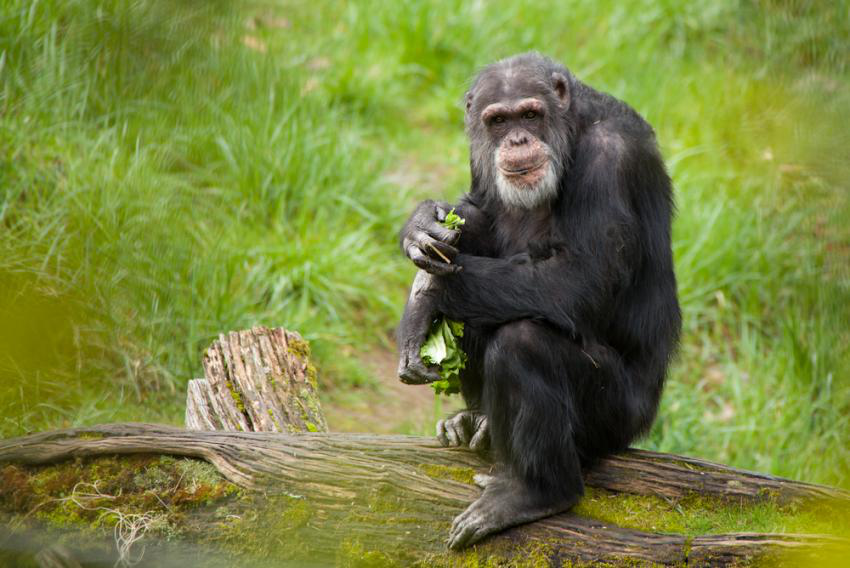

In [ ]:
display(images[0])

In [ ]:
IMAGE_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

IMAGENET_TRANSFORM = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

prepared_images = t.stack([IMAGENET_TRANSFORM(img) for img in images], dim=0).to(device)
assert prepared_images.shape == (len(images), 3, IMAGE_SIZE, IMAGE_SIZE)

In [ ]:
IMAGE_SIZE = 224
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

IMAGENET_TRANSFORM = transforms.Compose(
    [
        transforms.ToTensor(),
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
    ]
)

prepared_images = t.stack([IMAGENET_TRANSFORM(img) for img in images], dim=0).to(device)
assert prepared_images.shape == (len(images), 3, IMAGE_SIZE, IMAGE_SIZE)

All predictions match!


┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction                         ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ chimpanzee, chimp, Pan troglodytes │ 98.450%     │
│ Reference Model │ chimpanzee, chimp, Pan troglodytes │ 98.450%     │
└─────────────────┴────────────────────────────────────┴─────────────┘

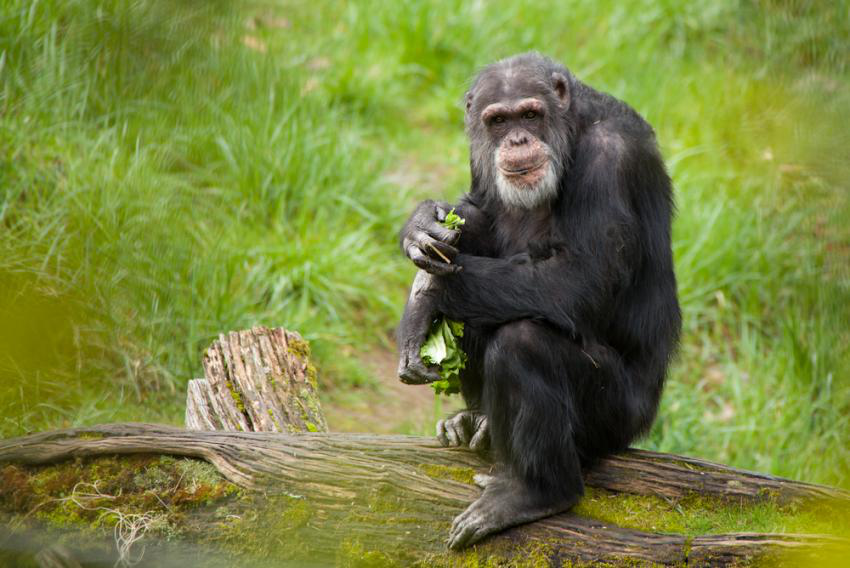

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction       ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ golden retriever │ 82.033%     │
│ Reference Model │ golden retriever │ 82.033%     │
└─────────────────┴──────────────────┴─────────────┘

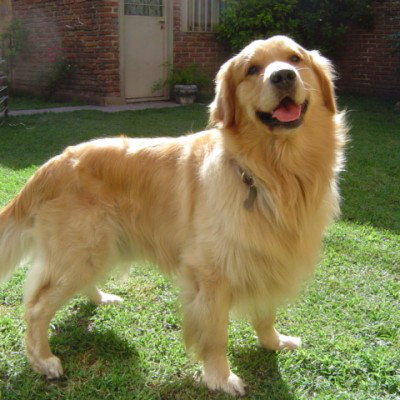

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction                                                                      ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus  │ 99.996%     │
│                 │ anatinus                                                                        │             │
│ Reference Model │ platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus  │ 99.996%     │
│                 │ anatinus                                                                        │             │
└─────────────────┴─────────────────────────────────────────────────────────────────────────────────┴─────────────┘

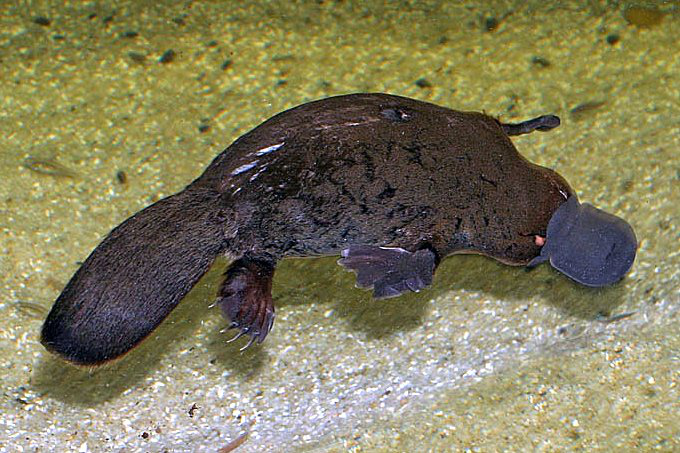

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ toyshop    │ 36.412%     │
│ Reference Model │ toyshop    │ 36.412%     │
└─────────────────┴────────────┴─────────────┘

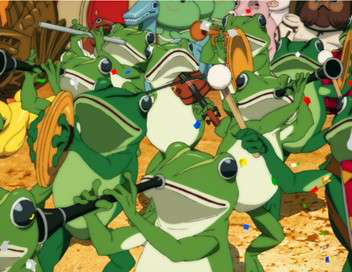

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ fountain   │ 82.999%     │
│ Reference Model │ fountain   │ 82.999%     │
└─────────────────┴────────────┴─────────────┘

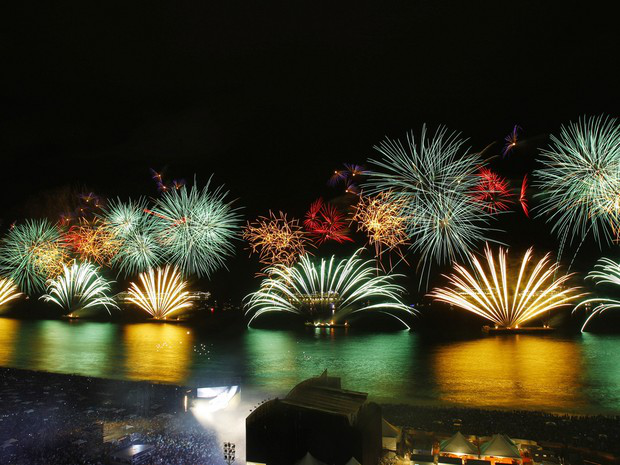

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction         ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ liner, ocean liner │ 21.822%     │
│ Reference Model │ liner, ocean liner │ 21.822%     │
└─────────────────┴────────────────────┴─────────────┘

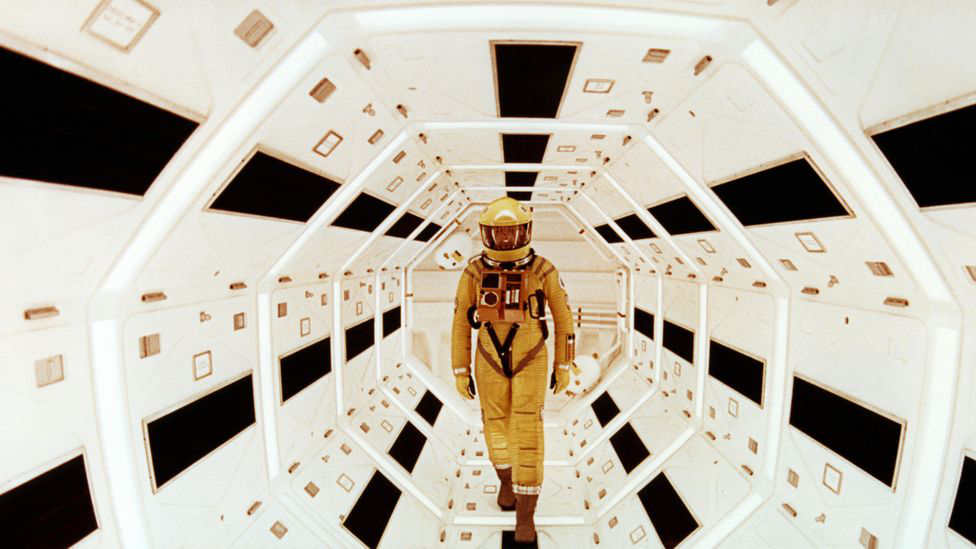

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction                           ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ common iguana, iguana, Iguana iguana │ 97.625%     │
│ Reference Model │ common iguana, iguana, Iguana iguana │ 97.625%     │
└─────────────────┴──────────────────────────────────────┴─────────────┘

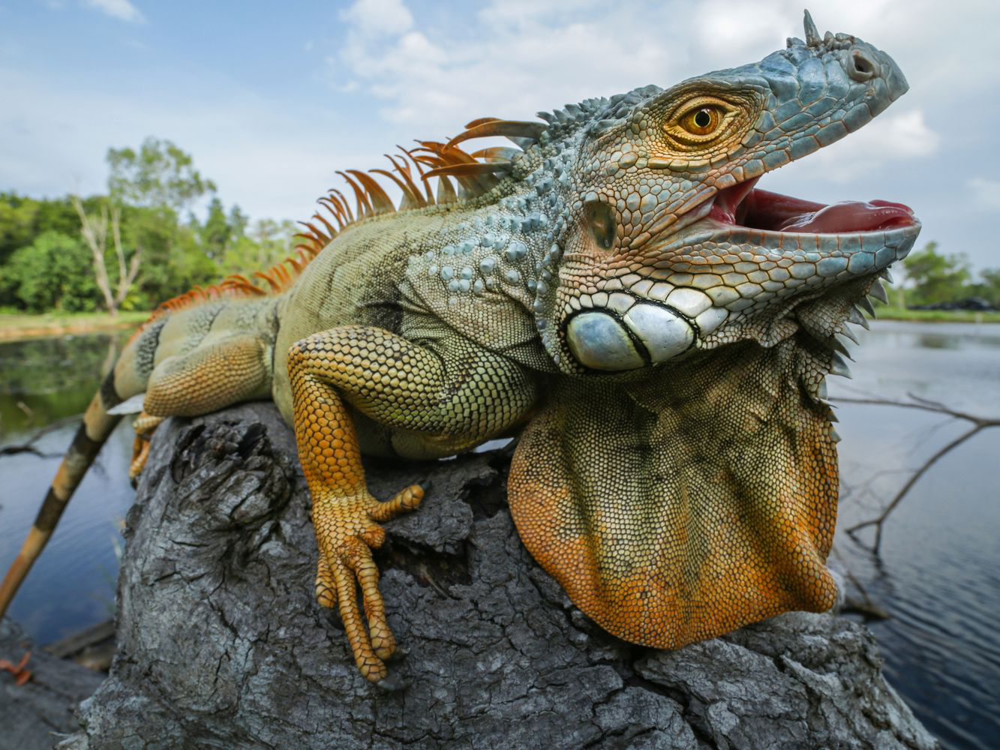

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ volcano    │ 99.991%     │
│ Reference Model │ volcano    │ 99.991%     │
└─────────────────┴────────────┴─────────────┘

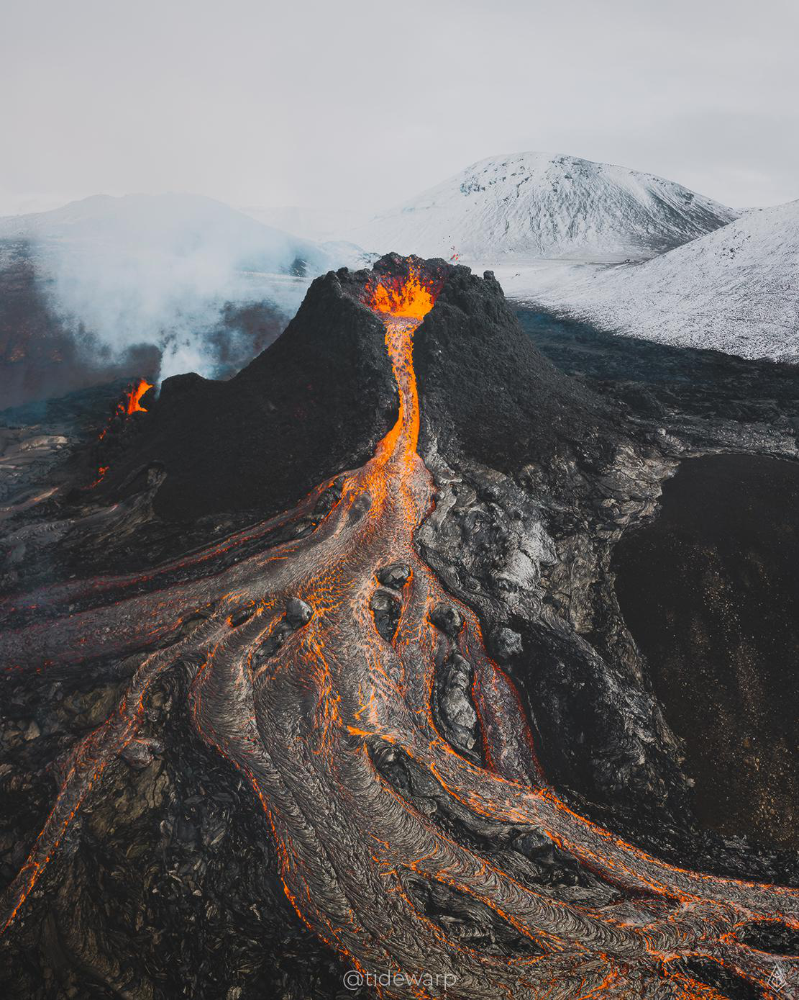

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction                               ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ binoculars, field glasses, opera glasses │ 17.982%     │
│ Reference Model │ binoculars, field glasses, opera glasses │ 17.982%     │
└─────────────────┴──────────────────────────────────────────┴─────────────┘

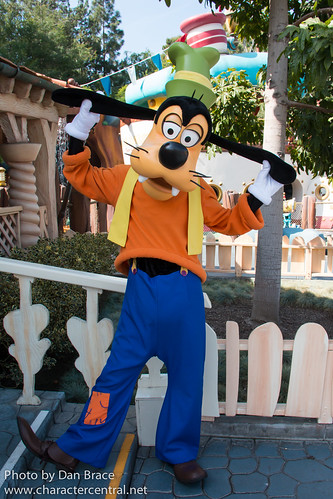

┏━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓
┃ Model           ┃ Prediction   ┃ Probability ┃
┡━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩
│ My ResNet       │ bucket, pail │ 14.104%     │
│ Reference Model │ bucket, pail │ 14.104%     │
└─────────────────┴──────────────┴─────────────┘

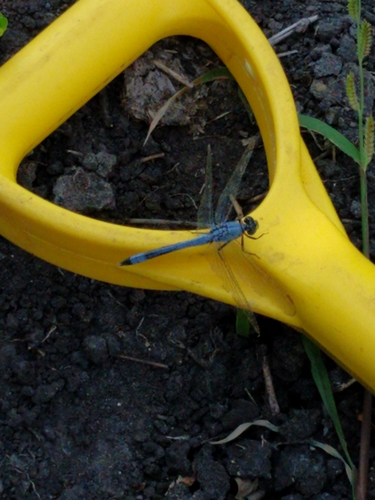

In [ ]:
@t.inference_mode()
def predict(
    model: nn.Module, images: Float[Tensor, "batch rgb h w"]
) -> tuple[Float[Tensor, " batch"], Int[Tensor, " batch"]]:
    """
    Returns the maximum probability and predicted class for each image, as a tensor of floats and
    ints respectively.
    """
    model.eval()
    logits = model(images)
    probs = F.softmax(logits, dim=-1)
    max_probs, predictions = t.max(probs, dim=-1)
    return max_probs, predictions


with open(section_dir / "imagenet_labels.json") as f:
    imagenet_labels = list(json.load(f).values())

# Check your predictions match those of the pretrained model
my_probs, my_predictions = predict(my_resnet, prepared_images)
pretrained_probs, pretrained_predictions = predict(pretrained_resnet, prepared_images)
assert (my_predictions == pretrained_predictions).all()
t.testing.assert_close(my_probs, pretrained_probs, atol=5e-4, rtol=0)  # tolerance of 0.05%
print("All predictions match!")

# Print out your predictions, next to the corresponding images
for i, img in enumerate(images):
    table = Table("Model", "Prediction", "Probability")
    table.add_row("My ResNet", imagenet_labels[my_predictions[i]], f"{my_probs[i]:.3%}")
    table.add_row(
        "Reference Model",
        imagenet_labels[pretrained_predictions[i]],
        f"{pretrained_probs[i]:.3%}",
    )
    rprint(table)
    display(img)

In [ ]:
class NanModule(nn.Module):
    """
    Define a module that always returns NaNs (we will use hooks to identify this error).
    """

    def forward(self, x):
        return t.full_like(x, float("nan"))


def hook_check_for_nan_output(module: nn.Module, input: tuple[Tensor], output: Tensor) -> None:
    """
    Hook function which detects when the output of a layer is NaN.
    """
    if t.isnan(output).any():
        raise ValueError(f"NaN output from {module}")


def add_hook(module: nn.Module) -> None:
    """
    Register our hook function in a module.

    Use model.apply(add_hook) to recursively apply the hook to model and all submodules.
    """
    module.register_forward_hook(hook_check_for_nan_output)


def remove_hooks(module: nn.Module) -> None:
    """
    Remove all hooks from module.

    Use module.apply(remove_hooks) to do this recursively.
    """
    module._backward_hooks.clear()
    module._forward_hooks.clear()
    module._forward_pre_hooks.clear()


# Create our model with a NaN in the middle, and apply a hook fn to it which checks for NaNs
model = nn.Sequential(nn.Identity(), NanModule(), nn.Identity())
model = model.apply(add_hook)

# Run the model, and our hook function should raise an error that gets caught by the try-except
try:
    input = t.randn(3)
    output = model(input)
except ValueError as e:
    print(e)

# Remove hooks at the end
model = model.apply(remove_hooks)

NaN output from NanModule()


In [ ]:
class NanModule(nn.Module):
    """
    Define a module that always returns NaNs (we will use hooks to identify this error).
    """

    def forward(self, x):
        return t.full_like(x, float("nan"))


def hook_check_for_nan_output(module: nn.Module, input: tuple[Tensor], output: Tensor) -> None:
    """
    Hook function which detects when the output of a layer is NaN.
    """
    if t.isnan(output).any():
        raise ValueError(f"NaN output from {module}")


def add_hook(module: nn.Module) -> None:
    """
    Register our hook function in a module.

    Use model.apply(add_hook) to recursively apply the hook to model and all submodules.
    """
    module.register_forward_hook(hook_check_for_nan_output)


def remove_hooks(module: nn.Module) -> None:
    """
    Remove all hooks from module.

    Use module.apply(remove_hooks) to do this recursively.
    """
    module._backward_hooks.clear()
    module._forward_hooks.clear()
    module._forward_pre_hooks.clear()


# Create our model with a NaN in the middle, and apply a hook fn to it which checks for NaNs
model = nn.Sequential(nn.Identity(), NanModule(), nn.Identity())
model = model.apply(add_hook)

# Run the model, and our hook function should raise an error that gets caught by the try-except
try:
    input = t.randn(3)
    output = model(input)
except ValueError as e:
    print(e)

# Remove hooks at the end
model = model.apply(remove_hooks)

##############################################
# Bonus : Feature Extraction / Finetunning

NaN output from NanModule()


In [ ]:
##############################################
# Bonus : Feature Extraction / Finetunning
##############################################

layer0, layer1 = nn.Linear(3, 4), nn.Linear(4, 5)

layer0.requires_grad_(False)  # generic code to set `param.requires_grad=False` recursively for a module / entire model

x = t.randn(3)
out = layer1(layer0(x)).sum()
out.backward()

print(layer0.weight.grad)
print(layer1.weight.grad)

None
tensor([[ 0.2123, -1.6092,  0.1169, -0.1918],
        [ 0.2123, -1.6092,  0.1169, -0.1918],
        [ 0.2123, -1.6092,  0.1169, -0.1918],
        [ 0.2123, -1.6092,  0.1169, -0.1918],
        [ 0.2123, -1.6092,  0.1169, -0.1918]])


In [ ]:
def get_resnet_for_feature_extraction(n_classes: int) -> ResNet34:
    """
    Creates a ResNet34 instance, replaces its final linear layer with a classifier for `n_classes`
    classes, and freezes all weights except the ones in this layer.

    Returns the ResNet model.
    """
    # Create a ResNet34 with the default number of classes
    my_resnet = ResNet34()
    
    # Load the pretrained weights
    pretrained_resnet = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)

    # Copy the weights over
    my_resnet = copy_weights(my_resnet, pretrained_resnet)

    # Freeze grads for all layers
    my_resnet.requires_grad_(False)

    # Redefine last layer, with new number of classes (this unfreezes the last layer)
    my_resnet.mlp = Linear(my_resnet.out_features_per_group[-1], n_classes)

    return my_resnet


tests.test_get_resnet_for_feature_extraction(get_resnet_for_feature_extraction)

All tests in `test_get_resnet_for_feature_extraction` passed!


In [ ]:
def get_cifar() -> tuple[datasets.CIFAR10, datasets.CIFAR10]:
    """Returns CIFAR-10 train and test sets."""
    cifar_trainset = datasets.CIFAR10(exercises_dir / "data", train=True, download=True, transform=IMAGENET_TRANSFORM)
    cifar_testset = datasets.CIFAR10(exercises_dir / "data", train=False, download=True, transform=IMAGENET_TRANSFORM)
    return cifar_trainset, cifar_testset


@dataclass
class ResNetTrainingArgs:
    batch_size: int = 64
    epochs: int = 5
    learning_rate: float = 1e-3
    n_classes: int = 10

In [ ]:
from torch.utils.data import Subset


def get_cifar_subset(trainset_size: int = 10_000, testset_size: int = 1_000) -> tuple[Subset, Subset]:
    """Returns a subset of CIFAR-10 train & test sets (slicing the first examples)."""
    cifar_trainset, cifar_testset = get_cifar()
    return Subset(cifar_trainset, range(trainset_size)), Subset(cifar_testset, range(testset_size))


def train(args: ResNetTrainingArgs) -> tuple[list[float], list[float], ResNet34]:
    """
    Performs feature extraction on ResNet, returning the model & lists of loss and accuracy.
    """
    # YOUR CODE HERE - write your train function for feature extraction
    model = get_resnet_for_feature_extraction(args.n_classes).to(device)
    trainset, testset = get_cifar_subset()
    trainloader = DataLoader(trainset, batch_size=args.batch_size, shuffle=True)
    testloader = DataLoader(testset, batch_size=args.batch_size, shuffle=False)
    optimizer = t.optim.Adam(model.mlp.parameters(), lr=args.learning_rate) 
    loss_list = []
    accuracy_list = []
    for epoch in range(args.epochs):
        model.train()
        for imgs, labels in tqdm(trainloader, desc=f"Epoch {epoch+1}/{args.epochs}"):
            imgs, labels = imgs.to(device), labels.to(device)
            logits = model(imgs)
            loss = F.cross_entropy(logits, labels)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
            loss_list.append(loss.item())

        model.eval()
        correct, total = 0, 0
        with t.inference_mode():
            for imgs, labels in testloader:
                imgs, labels = imgs.to(device), labels.to(device)
                logits = model(imgs)
                predictions = t.argmax(logits, dim=-1)
                correct += (predictions == labels).sum().item()
                total += labels.shape[0]
            accuracy_list.append(correct / total)

    return loss_list, accuracy_list, model

args = ResNetTrainingArgs()
loss_list, accuracy_list, model = train(args)

line(
    y=[
        loss_list,
        [1 / args.n_classes] + accuracy_list,
    ],  # we start by assuming a uniform accuracy of 10%
    use_secondary_yaxis=True,
    x_max=args.epochs * 10_000,
    labels={"x": "Num examples seen", "y1": "Cross entropy loss", "y2": "Test Accuracy"},
    title="ResNet Feature Extraction",
    width=600,
)

Epoch 5/5: 100%|██████████| 157/157 [02:10<00:00,  1.21it/s]


In [ ]:
a = t.arange(18).reshape(3,6)
print(a)
a.as_strided((2,5),(5,3))

tensor([[ 0,  1,  2,  3,  4,  5],
        [ 6,  7,  8,  9, 10, 11],
        [12, 13, 14, 15, 16, 17]])


tensor([[ 0,  3,  6,  9, 12],
        [ 5,  8, 11, 14, 17]])

In [ ]:
test_input = t.tensor(
    [
        [0, 1, 2, 3, 4],
        [5, 6, 7, 8, 9],
        [10, 11, 12, 13, 14],
        [15, 16, 17, 18, 19],
    ],
    dtype=t.float,
)

TestCase = namedtuple("TestCase", ["output", "size", "stride"])

test_cases = [
    # Example 1
    TestCase(
        output=t.tensor([0, 1, 2, 3]),
        size=(4,),
        stride=(1,),
    ),
    # Example 2
    TestCase(
        output=t.tensor([[0, 2], [5, 7]]),
        size=(2, 2),
        stride=(5, 2),
    ),
    # Start of exercises (you should fill in size & stride for all 6 of these):
    TestCase(
        output=t.tensor([0, 1, 2, 3, 4]),
        size=(5,),
        stride=(1,),
    ),
    TestCase(
        output=t.tensor([0, 5, 10, 15]),
        size=(4,),
        stride=(5,),
    ),
    TestCase(
        output=t.tensor([[0, 1, 2], [5, 6, 7]]),
        size=(2,3),
        stride=(5,1),
    ),
    TestCase(
        output=t.tensor([[0, 1, 2], [10, 11, 12]]),
        size=(2,3),
        stride=(10,1),
    ),
    TestCase(
        output=t.tensor([[0, 0, 0], [11, 11, 11]]),
        size=(2,3),
        stride=(11,0),
    ),
    TestCase(
        output=t.tensor([0, 6, 12, 18]),
        size=(4,),
        stride=(6,),
    ),
]


for i, test_case in enumerate(test_cases):
    if (test_case.size is None) or (test_case.stride is None):
        print(f"Test {i} failed: attempt missing.")
    else:
        actual = test_input.as_strided(size=test_case.size, stride=test_case.stride)
        if (test_case.output != actual).any():
            print(f"Test {i} failed\n  Expected: {test_case.output}\n  Actual: {actual}")
        else:
            print(f"Test {i} passed!")

Test 0 passed!
Test 1 passed!
Test 2 passed!
Test 3 passed!
Test 4 passed!
Test 5 passed!
Test 6 passed!
Test 7 passed!


In [ ]:
def as_strided_trace(mat: Float[Tensor, "i j"]) -> Float[Tensor, ""]:
    """
    Returns the same as `torch.trace`, using only `as_strided` and `sum` methods.
    """
    # Get the size of the input matrix
    i, j = mat.shape
    assert i == j, "Input must be a square matrix."

    # Use as_strided to get the diagonal elements, then sum them up
    diag_elements = mat.as_strided(size=(i,), stride=(j + 1,))
    trace = diag_elements.sum()
    return trace


tests.test_trace(as_strided_trace)

All tests in `test_trace` passed!


In [ ]:
test_input.as_strided((4,5), (5,1))

tensor([[ 0.,  1.,  2.,  3.,  4.],
        [ 5.,  6.,  7.,  8.,  9.],
        [10., 11., 12., 13., 14.],
        [15., 16., 17., 18., 19.]])

In [ ]:
t.arange(5).as_strided((4,5),(0,1))

tensor([[0, 1, 2, 3, 4],
        [0, 1, 2, 3, 4],
        [0, 1, 2, 3, 4],
        [0, 1, 2, 3, 4]])

In [ ]:
t.arange(5).as_strided((4,5),(1,0))

tensor([[0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1],
        [2, 2, 2, 2, 2],
        [3, 3, 3, 3, 3]])

In [ ]:
def as_strided_mv(mat: Float[Tensor, "i j"], vec: Float[Tensor, " j"]) -> Float[Tensor, " i"]:
    """
    Returns the same as `torch.matmul`, using only `as_strided` and `sum` methods.
    """
    i, j = mat.shape
    assert vec.shape == (j,), "Incompatible shapes."

    # Use as_strided to get all the rows of the matrix, then do elementwise multiplication with the vector and sum
    vec_ = vec.as_strided(size=(i, j), stride=(0, vec.stride(0)))
    mv_product = (mat * vec_).sum(dim=1)
    return mv_product


tests.test_mv(as_strided_mv)
tests.test_mv2(as_strided_mv)

All tests in `test_mv` passed!
All tests in `test_mv2` passed!


In [ ]:
a = t.arange(9).reshape(3,3)
print(a)
a.as_strided((3,3,3),(3,1,0))

tensor([[0, 1, 2],
        [3, 4, 5],
        [6, 7, 8]])


tensor([[[0, 0, 0],
         [1, 1, 1],
         [2, 2, 2]],

        [[3, 3, 3],
         [4, 4, 4],
         [5, 5, 5]],

        [[6, 6, 6],
         [7, 7, 7],
         [8, 8, 8]]])

In [ ]:
a = t.arange(9).reshape(3,3)
print(a)
a.as_strided((3,3,3),(0,3,1))

tensor([[0, 1, 2],
        [3, 4, 5],
        [6, 7, 8]])


tensor([[[0, 1, 2],
         [3, 4, 5],
         [6, 7, 8]],

        [[0, 1, 2],
         [3, 4, 5],
         [6, 7, 8]],

        [[0, 1, 2],
         [3, 4, 5],
         [6, 7, 8]]])

In [ ]:
def as_strided_mm(matA: Float[Tensor, "i j"], matB: Float[Tensor, "j k"]) -> Float[Tensor, "i k"]:
    """
    Returns the same as `torch.matmul`, using only `as_strided` and `sum` methods.
    """
    i,j = matA.shape
    j2, k = matB.shape
    assert j == j2, "Incompatible shapes."

    mA = matA.as_strided(size=(i, j, k), stride=(matA.stride(0), matA.stride(1), 0))
    mB = matB.as_strided(size=(i, j, k), stride=(0, matB.stride(0), matB.stride(1)))
    mm_product = (mA * mB).sum(dim=1)
    return mm_product


tests.test_mm(as_strided_mm)
tests.test_mm2(as_strided_mm)

All tests in `test_mm` passed!
All tests in `test_mm2` passed!


In [ ]:
def conv1d_minimal_simple(
    x: Float[Tensor, " width"], weights: Float[Tensor, " kernel_width"]
) -> Float[Tensor, " output_width"]:
    """
    Like torch's conv1d using bias=False and all other keyword arguments left at default values.

    Simplifications: batch = input channels = output channels = 1.
    """

    out_length = x.shape[0] - weights.shape[0] + 1
    input = x.as_strided((out_length, weights.shape[0]), (1, 1))

    return einops.einsum(input, weights, "o w, w -> o")


tests.test_conv1d_minimal_simple(conv1d_minimal_simple)

All tests in `test_conv1d_minimal_simple` passed!


In [ ]:
def conv1d_minimal_simple(
    x: Float[Tensor, " width"], weights: Float[Tensor, " kernel_width"]
) -> Float[Tensor, " output_width"]:
    """
    Like torch's conv1d using bias=False and all other keyword arguments left at default values.

    Simplifications: batch = input channels = output channels = 1.
    """
    # Get output width, using formula
    w = x.shape[0]
    kw = weights.shape[0]
    ow = w - kw + 1

    # Get strides for x
    s_w = x.stride(0)

    # Get strided x (the new dimension has same stride as the original stride of x)
    x_new_shape = (ow, kw)
    x_new_stride = (s_w, s_w)
    # Common error: s_w is always 1 if the tensor `x` wasn't itself created via striding, so if you
    # put 1 here you won't spot your mistake until you try this with conv2d!
    x_strided = x.as_strided(size=x_new_shape, stride=x_new_stride)

    return einops.einsum(x_strided, weights, "ow kw, kw -> ow")

In [ ]:
def conv1d_minimal(
    x: Float[Tensor, "batch in_channels width"],
    weights: Float[Tensor, "out_channels in_channels kernel_width"],
) -> Float[Tensor, "batch out_channels output_width"]:
    """
    Like torch's conv1d using bias=False and all other keyword arguments left at default values.
    """
    b, in_, w = x.shape
    ou_, in__, kw = weights.shape
    if in_ != in__:
        raise ValueError("Mismatching input channels.")
    ow = w - kw + 1

    s_b, s_in, s_w = x.stride()

    x_new_shape = (b, in_, ow, kw)
    x_new_stride = (s_b, s_in, s_w, s_w)
    x_strided = x.as_strided(size=x_new_shape, stride=x_new_stride)
    return einops.einsum(x_strided, weights, "b in ow kw, ou in kw -> b ou ow")



tests.test_conv1d_minimal(conv1d_minimal)

All tests in `test_conv1d_minimal` passed!


In [ ]:
def conv2d_minimal(
    x: Float[Tensor, "batch in_channels height width"],
    weights: Float[Tensor, "out_channels in_channels kernel_height kernel_width"],
) -> Float[Tensor, "batch out_channels height_padding width_padding"]:
    """
    Like torch's conv2d using bias=False and all other keyword arguments left at default values.
    """
    b, in_, h, w = x.shape
    ou_, in__, kh, kw = weights.shape
    if in_ != in__:
        raise ValueError("Mismatching input channels.")

    oh = h - kh + 1
    ow = w - kw + 1

    s_b, s_in, s_h, s_w = x.stride()
    s_kout, s_kin, s_kh, s_kw = weights.stride()
    x_new_shape = (b, in_, oh, ow, kh, kw)
    x_new_stride = (s_b, s_in, s_h, s_w, s_h, s_w)
    x_strided = x.as_strided(size=x_new_shape, stride=x_new_stride)
    return einops.einsum(x_strided, weights, "b in oh ow kh kw, ou in kh kw -> b ou oh ow")


tests.test_conv2d_minimal(conv2d_minimal)

All tests in `test_conv2d_minimal` passed!


In [ ]:
def pad1d(
    x: Float[Tensor, "batch in_channels width"], left: int, right: int, pad_value: float
) -> Float[Tensor, "batch in_channels width_padding"]:
    """Return a new tensor with padding applied to the edges."""
    b, in_, w = x.shape
    new_width = left + w + right
    new_shape = b, in_, new_width
    new_x = x.new_full(size=new_shape, fill_value=pad_value)
    new_x[...,left:left+w] = x
    return new_x


tests.test_pad1d(pad1d)
tests.test_pad1d_multi_channel(pad1d)

All tests in `test_pad1d` passed!
All tests in `test_pad1d_multi_channel` passed!


In [ ]:
def pad2d(
    x: Float[Tensor, "batch in_channels height width"],
    left: int,
    right: int,
    top: int,
    bottom: int,
    pad_value: float,
) -> Float[Tensor, "batch in_channels height_padding width_padding"]:
    """Return a new tensor with padding applied to the width & height dimensions."""
    b, in_, h, w = x.shape
    new_h = top + h + bottom
    new_w = left + w + right
    new_shape = b, in_, new_h, new_w
    new_x = x.new_full(size=new_shape, fill_value=pad_value)
    new_x[..., top:top+h, left:left+w] = x
    return new_x


tests.test_pad2d(pad2d)
tests.test_pad2d_multi_channel(pad2d)

All tests in `test_pad2d` passed!
All tests in `test_pad2d_multi_channel` passed!


In [ ]:
def conv1d(
    x: Float[Tensor, "batch in_channels width"],
    weights: Float[Tensor, "out_channels in_channels kernel_width"],
    stride: int = 1,
    padding: int = 0,
) -> Float[Tensor, "batch out_channels width"]:
    """
    Like torch's conv1d using bias=False.
    """
    # Apply padding to the input if necessary
    if padding > 0:
        x = pad1d(x, left=padding, right=padding, pad_value=0.0)

    b, in_, w = x.shape
    ou_, in__, kw = weights.shape
    if in_ != in__:
        raise ValueError("Mismatching input channels.")

    ow = (w - kw) // stride + 1

    s_b, s_in, s_w = x.stride()
    x_new_shape = (b, in_, ow, kw)
    x_new_stride = (s_b, s_in, s_w * stride, s_w)
    x_strided = x.as_strided(size=x_new_shape, stride=x_new_stride)
    return einops.einsum(x_strided, weights, "b in ow kw, ou in kw -> b ou ow")


tests.test_conv1d(conv1d)

All tests in `test_conv1d` passed!


In [ ]:
IntOrPair = int | tuple[int, int]
Pair = tuple[int, int]


def force_pair(v: IntOrPair) -> Pair:
    """Convert v to a pair of int, if it isn't already."""
    if isinstance(v, tuple):
        if len(v) != 2:
            raise ValueError(v)
        return (int(v[0]), int(v[1]))
    elif isinstance(v, int):
        return (v, v)
    raise ValueError(v)


# Examples of how this function can be used:
for v in [(1, 2), 2, (1, 2, 3)]:
    try:
        print(f"{v!r:9} -> {force_pair(v)!r}")
    except ValueError:
        print(f"{v!r:9} -> ValueError")

(1, 2)    -> (1, 2)
2         -> (2, 2)
(1, 2, 3) -> ValueError


In [ ]:
def conv2d(
    x: Float[Tensor, "batch in_channels height width"],
    weights: Float[Tensor, "out_channels in_channels kernel_height kernel_width"],
    stride: IntOrPair = 1,
    padding: IntOrPair = 0,
) -> Float[Tensor, "batch out_channels height width"]:
    """
    Like torch's conv2d using bias=False.
    """
    stride_h, stride_w = force_pair(stride)
    pad_h, pad_w = force_pair(padding)

    # Apply padding to the input if necessary
    if (pad_h > 0) or (pad_w > 0):
        x = pad2d(x, left=pad_w, right=pad_w, top=pad_h, bottom=pad_h, pad_value=0.0)

    b, in_, h, w = x.shape
    ou_, in__, kh, kw = weights.shape
    if in_ != in__:
        raise ValueError("Mismatching input channels.")

    oh = (h - kh) // stride_h + 1
    ow = (w - kw) // stride_w + 1

    s_b, s_in, s_h, s_w = x.stride()
    x_new_shape = (b, in_, oh, ow, kh, kw)
    x_new_stride = (s_b, s_in, s_h * stride_h, s_w * stride_w, s_h, s_w)
    x_strided = x.as_strided(size=x_new_shape, stride=x_new_stride)
    return einops.einsum(x_strided, weights, "b in oh ow kh kw, ou in kh kw -> b ou oh ow")


tests.test_conv2d(conv2d)

All tests in `test_conv2d` passed!


In [ ]:
def maxpool2d(
    x: Float[Tensor, "batch in_channels height width"],
    kernel_size: IntOrPair,
    stride: IntOrPair | None = None,
    padding: IntOrPair = 0,
) -> Float[Tensor, "batch out_channels height width"]:
    """
    Like PyTorch's maxpool2d. If stride is None, should be equal to kernel size.
    """
    kernel_h, kernel_w = force_pair(kernel_size)
    if stride is None:
        stride_h, stride_w = kernel_h, kernel_w
    else:
        stride_h, stride_w = force_pair(stride)
    pad_h, pad_w = force_pair(padding)

    # Apply padding to the input if necessary
    if (pad_h > 0) or (pad_w > 0):
        x = pad2d(x, left=pad_w, right=pad_w, top=pad_h, bottom=pad_h, pad_value=float("-inf"))

    b, in_, h, w = x.shape

    oh = (h - kernel_h) // stride_h + 1
    ow = (w - kernel_w) // stride_w + 1

    s_b, s_in, s_h, s_w = x.stride()
    x_new_shape = (b, in_, oh, ow, kernel_h, kernel_w)
    x_new_stride = (s_b, s_in, s_h * stride_h, s_w * stride_w, s_h, s_w)
    x_strided = x.as_strided(size=x_new_shape, stride=x_new_stride)
    return x_strided.amax(dim=(-1,-2))


tests.test_maxpool2d(maxpool2d)

All tests in `test_maxpool2d` passed!
